# Setting up environment modules and basic settings

## Documentation

## Generating the environment (if you use sahre enviroment, its not necessary)

The following needs to be run in the command-line

In [ ]:
conda create -n scFates -c conda-forge -c r python=3.8 r-mgcv rpy2 -y
conda activate scFates

# Install new jupyter server
conda install -c conda-forge jupyter

# Or add to an existing jupyter server
conda install -c conda-forge ipykernel
python -m ipykernel install --user --name scFates --display-name "scFates"

# Install scFates
pip install scFates

## Loading modules and settings

In [1]:
import sys
!{sys.executable} -m pip -q install palantir fa2
import warnings
warnings.filterwarnings("ignore")
import os, sys
# to avoid any possible jupyter crashes due to rpy2 not finding the R install on conda
os.environ['R_HOME'] = sys.exec_prefix+"/lib/R/"

  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> [42 lines of output]
      Installing fa2 package (fastest forceatlas2 python implementation)
      
      >>>> Cython is installed?
      Yes
      
      >>>> Starting to install!
      
      /home/s468630/.local/lib/python3.10/site-packages/setuptools/dist.py:759: SetuptoolsDeprecationWarning: License classifiers are deprecated.
      !!
      
              ********************************************************************************
              Please consider removing the following classifiers in favor of a SPDX license expression:
      
              License :: OSI Approved :: GNU General Public License v3 (GPLv3)
      
              See https://packaging.python.org/en/latest/guides/writing-pyproject-toml/#license for details.
              ********************************************************************************
      
      !!
        self._f

In [38]:
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout

## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline
sc.set_figure_params()
scf.set_figure_pubready()

# Preprocessing pipeline from Palantir

## Load, normalize and log-transform count data

### Load the data

In [4]:
#original_adata = sc.read('/storage/users/data/PANC/H5AD_file/adata_filtered_no2D_hvg_clust.h5ad')
original_adata = sc.read('/storage/users/data/PANC/H5AD_file/adata_filtered_no2D_hvg_clust.h5ad')
#/storage/users/data/PANC/adata_clustered_10066.h5ad'

In [5]:
original_adata.var_names

Index(['ENSG00000187608', 'ENSG00000224969', 'ENSG00000184163',
       'ENSG00000142609', 'ENSG00000287586', 'ENSG00000049246',
       'ENSG00000238290', 'ENSG00000204624', 'ENSG00000117122',
       'ENSG00000117115',
       ...
       'ENSG00000013619', 'ENSG00000029993', 'ENSG00000011677',
       'ENSG00000198883', 'ENSG00000182492', 'ENSG00000067842',
       'ENSG00000130821', 'ENSG00000198910', 'ENSG00000099721',
       'ENSG00000198899'],
      dtype='object', name='feature_id', length=1992)

In [6]:
original_adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [7]:
adata = original_adata

### Test whether there are data errors or gaps or redundancies

In [8]:
plt.rcParams['font.family'] = 'DejaVu Sans'

In [9]:
import numpy as np
from scipy.sparse import issparse

# Check if the matrix is sparse
if issparse(adata.X):
    zero_count = adata.X.size - adata.X.nnz
else:
    zero_count = np.count_nonzero(adata.X == 0)

total_elements = adata.X.shape[0] * adata.X.shape[1]
print(f"Total number of zeros: {zero_count}")
print(f"Percentage of zeros: {zero_count / total_elements * 100:.2f}%")

# Check for entirely zero rows or columns
if issparse(adata.X):
    zero_rows = np.squeeze(np.array((adata.X.sum(axis=1) == 0)))
    zero_cols = np.squeeze(np.array((adata.X.sum(axis=0) == 0)))
else:
    zero_rows = np.all(adata.X == 0, axis=1)
    zero_cols = np.all(adata.X == 0, axis=0)

print("Number of completely zero rows: ", np.sum(zero_rows))
print("Number of completely zero columns: ", np.sum(zero_cols))

# Optionally, filter out zero rows and columns
if np.sum(zero_rows) > 0:
    adata = adata[~zero_rows, :]
if np.sum(zero_cols) > 0:
    adata = adata[:, ~zero_cols]

Total number of zeros: 0
Percentage of zeros: 0.00%
Number of completely zero rows:  0
Number of completely zero columns:  0


In [10]:
# Remove zero columns from the dataset
if issparse(adata.X):
    # For sparse matrix
    adata = adata[:, ~np.squeeze(np.array((adata.X.sum(axis=0) == 0)))]
else:
    # For dense matrix
    adata = adata[:, ~np.all(adata.X == 0, axis=0)]

In [11]:
# Count empty strings in var_names
empty_count = np.sum(adata.var_names == "")
print(f"Number of empty strings in var_names: {empty_count}")



Number of empty strings in var_names: 0


In [12]:
# Filter out rows with empty strings in var_names
adata = adata[:, adata.var_names != ""]

In [13]:
adata

View of AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [14]:
print(adata.X.shape)

(6235, 1992)


In [15]:
adata

View of AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

## Preprocess data again (optional)

In [16]:
# Preprocess Data
#sc.pp.normalize_total(adata, target_sum=1e4)
#sc.pp.normalize_total(adata)
#sc.pp.scale(adata, max_value=10)

## Select PCA projections

In [17]:
# Dimension reduction and Clustering 
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40) # Neighborhood Graph Construction
#sc.tl.umap(adata) # Compute UMAP embedding

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 40


Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7c46c258b7f0>
Traceback (most recent call last):
  File "/home/s468630/.local/lib/python3.10/site-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/home/s468630/.local/lib/python3.10/site-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/home/s468630/.local/lib/python3.10/site-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/usr/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: /home/s468630/.local/lib/python3.10/site-packages/scipy.libs/libscipy_openblas-c128ec02.so: cannot open shared object file: No such file or directory


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)


In [18]:
adata.obsm

AxisArrays with keys: X_pca, X_umap

In [19]:
pca_projections = pd.DataFrame(adata.obsm["X_pca"],index=adata.obs_names)

In [20]:
pca_projections

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
barcode,,,,,,,,,,,,,,,,,,,,,
AAACCCAGTAGGCTCC-1,-8.051603,-2.089638,-3.260369,0.035019,0.274669,1.304368,0.201708,0.448954,0.228912,0.871616,...,-1.087802,0.291467,0.020834,-1.304294,-0.325743,-0.200570,-0.023077,0.821386,-0.584833,0.150352
AAACCCAGTCGCAACC-1,-6.332712,-2.608224,1.952160,-6.229910,-1.414730,-3.435136,-1.463405,-1.482747,-0.351048,0.142636,...,0.442111,-0.057296,0.427508,1.304843,2.059539,0.104736,-0.380605,0.031231,-1.812838,0.536376
AAACCCATCCACAAGT-1,-3.282892,-3.138699,3.046442,6.598270,-1.777339,4.181217,0.048696,-0.457507,0.298546,2.683938,...,0.584153,-0.470760,0.321784,0.909368,0.754531,0.897497,1.716894,0.243540,0.049842,-0.756723
AAACGCTTCACTACGA-1,-4.689174,-3.499806,1.863668,2.255062,2.079900,0.717046,2.066679,-0.825685,-0.256667,-0.134257,...,-0.357958,-0.572936,0.165177,-0.766891,-0.885959,-1.171563,-0.758300,1.460189,-1.263074,0.497039
AAAGAACAGATACAGT-1,-6.694627,-4.057181,1.214690,-3.851257,2.325297,-1.662580,1.999428,-0.944102,1.548660,-0.885295,...,-1.034389,0.100621,1.417248,0.347457,-0.290665,-1.151749,0.376349,0.542058,-0.387281,-0.852154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTACTGTCATTACTC-1,-1.746183,2.618844,0.091580,-4.158597,-3.606212,0.303227,-2.212980,1.676301,0.377757,-3.744312,...,-0.914573,0.040651,0.267175,-0.245326,-0.156095,-0.473818,-0.801114,0.188279,0.017575,-0.625388
TTTCACAGTGATATAG-1,8.589562,7.048331,0.086537,2.391889,-0.488324,1.897754,0.748209,-4.430013,1.577518,-2.174651,...,0.868371,1.074262,0.979448,0.207570,0.210515,0.234131,0.035266,-0.111595,0.157253,0.020179
TTTCACATCGATGCAT-1,4.974769,3.067484,2.964421,-1.085120,-2.060163,-2.250435,3.339990,-0.174571,0.782044,1.563459,...,-1.555606,1.709996,-2.243814,0.105948,-0.501841,-1.526213,-0.597811,-0.920539,1.015730,-0.626957


## Run Palantir to obtain multiscale diffusion space

In [21]:
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


## Generate embedding from the multiscale diffusion space

In [22]:
# generate neighbor graph in multiscale diffusion space
adata.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(adata,n_neighbors=10,use_rep="X_palantir")

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [23]:
adata.obsm

AxisArrays with keys: X_pca, X_umap, X_palantir

In [24]:
# draw ForceAtlas2 embedding using 2 first PCs as initial positions
adata.obsm["X_pca2d"]=adata.obsm["X_pca"][:,:2]
sc.tl.draw_graph(adata,init_pos='X_pca2d')

drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:29)


In [25]:
print(adata.obs.keys())
print(adata.var.keys())

Index(['condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts',
       'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes',
       'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes',
       'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito',
       'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo',
       'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores',
       'predicted_doublets', 'outlier', 'leiden'],
      dtype='object')
Index(['n_cells_by_counts', 'mean_counts', 'log1p_mean_counts',
       'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO',
       'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means',
       'dispersions', 'dispersions_norm'],
      dtype='object')


## Plotting results

In [26]:
plt.rcParams['font.family'] = 'DejaVu Sans'

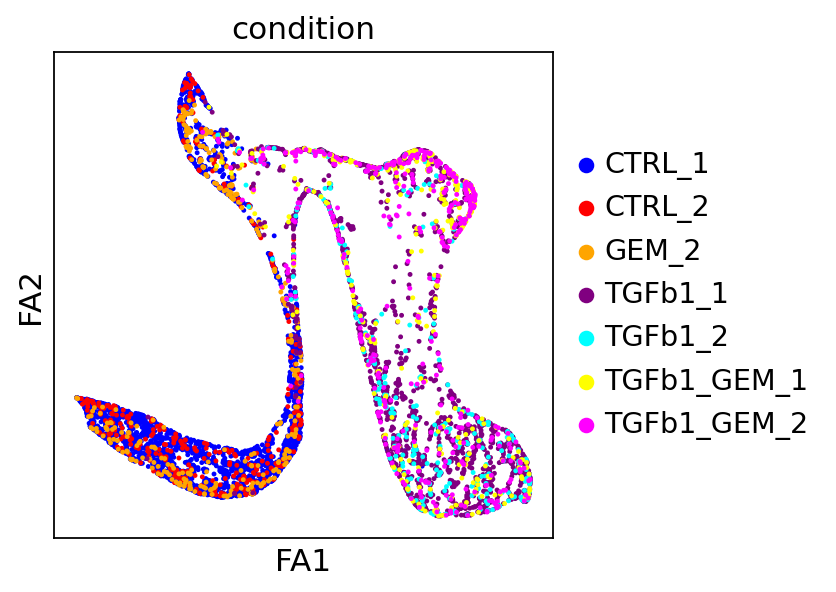

In [27]:

sc.pl.draw_graph(adata,color="condition",color_map="RdBu_r")

In [28]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'draw_graph'
    obsm: 'X_pca', 'X_umap', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

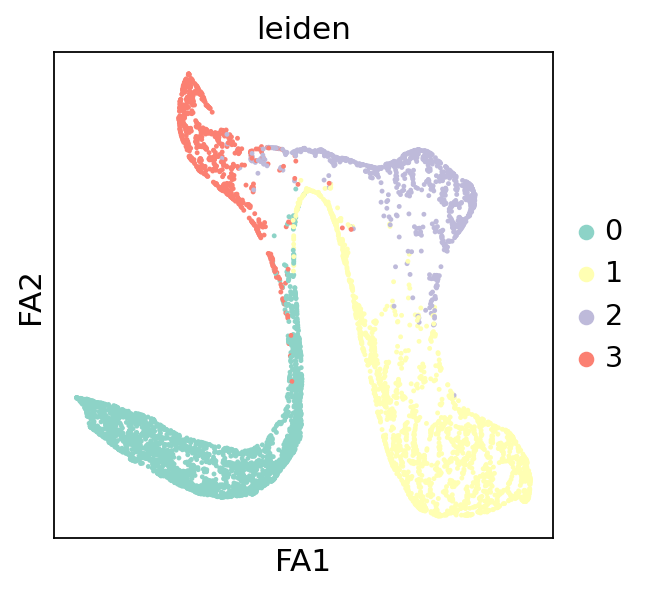

In [29]:
sc.pl.draw_graph(adata,color="leiden",color_map="RdBu_r")

## Tree learning with SimplePPT

In [30]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'draw_graph'
    obsm: 'X_pca', 'X_umap', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [31]:
scf.tl.tree(adata,method="ppt",Nodes=100,use_rep="palantir",
            device="cpu",seed=2,ppt_lambda=90,ppt_sigma=0.005,ppt_nsteps=200)

inferring a principal tree --> parameters used 
    100 principal points, sigma = 0.005, lambda = 90, metric = euclidean
    fitting:  22%|██▏       | 43/200 [00:03<00:11, 13.84it/s]
    converged
    finished (0:00:03) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.


## projecting results onto ForceAtlas2 embedding

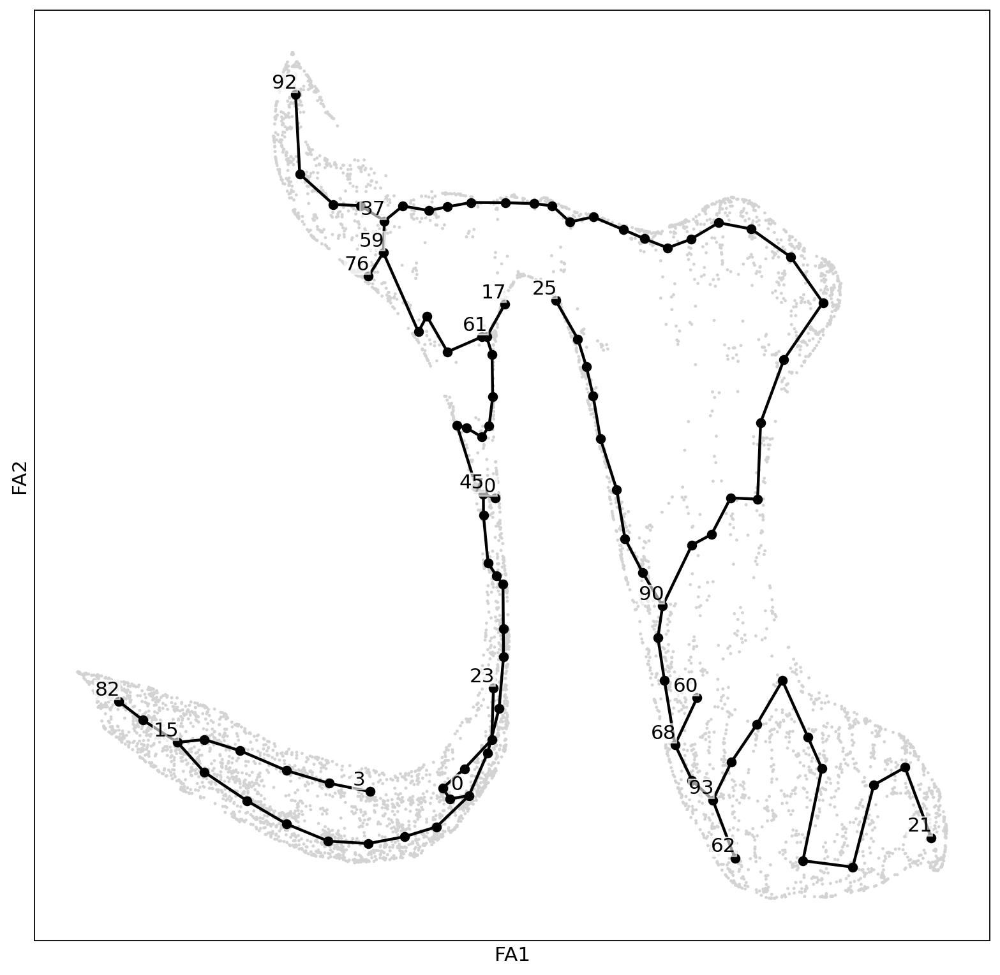

In [32]:
plt.rcParams['figure.figsize'] = [12, 12] 
scf.pl.graph(adata)

## Selecting a root and computing pseudotime

### Using the marker condition to tell the root.

In [43]:
scf.tl.root(adata,23)

node 23 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.


In [51]:
# Build the tree
scf.tl.tree(
    adata,
    method="ppt",
    Nodes=80,  # fewer than 100 to be safe
    use_rep="palantir",
    device="cpu",
    seed=2,
    ppt_lambda=80,
    ppt_sigma=0.01,
    ppt_nsteps=200
)

# Set the root (optional but recommended)
scf.tl.root(adata, root="t")

# Run pseudotime mapping with safer n_map
scf.tl.pseudotime(adata, n_jobs=10, n_map=50, seed=20)


inferring a principal tree --> parameters used 
    80 principal points, sigma = 0.01, lambda = 80, metric = euclidean
    fitting:  33%|███▎      | 66/200 [00:03<00:06, 21.12it/s]
    converged
    finished (0:00:03) --> added 
    .uns['ppt'], dictionnary containing inferred tree.
    .obsm['X_R'] soft assignment of cells to principal points.
    .uns['graph']['B'] adjacency matrix of the principal points.
    .uns['graph']['F'] coordinates of principal points in representation space.
automatic root selection using t values
node 25 selected as a root --> added
    .uns['graph']['root'] selected root.
    .uns['graph']['pp_info'] for each PP, its distance vs root and segment assignment.
    .uns['graph']['pp_seg'] segments network information.
projecting cells onto the principal graph
    mappings: 100%|██████████| 50/50 [00:27<00:00,  1.85it/s]
    finished (0:00:29) --> added
    .obs['edge'] assigned edge.
    .obs['t'] pseudotime value.
    .obs['seg'] segment of the tree assigned

In [52]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap', 'draw_graph', 'graph', 'ppt', 'pseudotime_list', 'milestones_colors', 'seg_colors'
    obsm: 'X_pca', 'X_umap', 'X_palantir', 'X_pca2

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

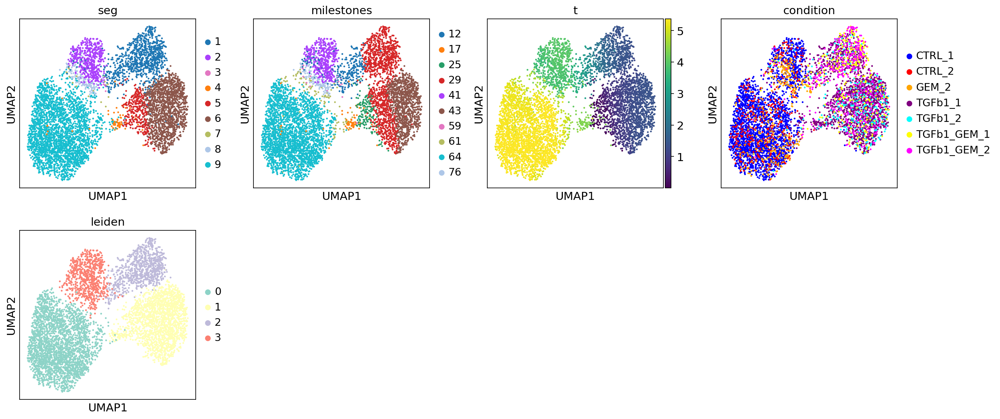

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

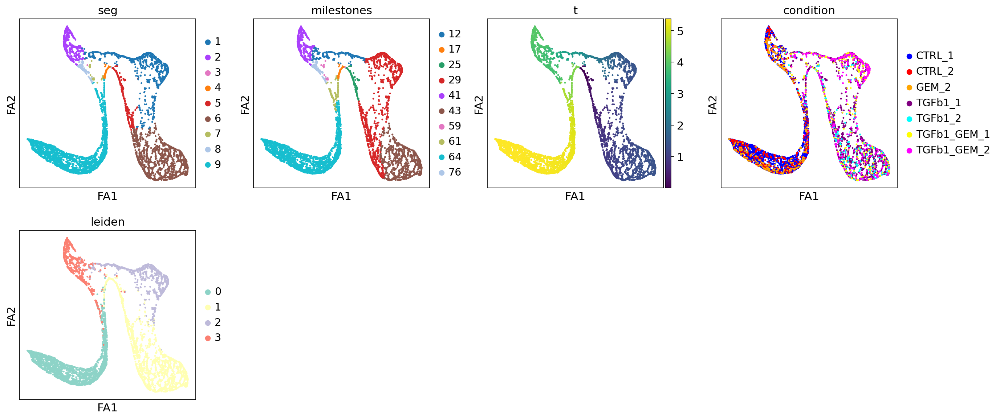

In [53]:
sc.pl.umap(adata, color=["seg","milestones","t", "condition","leiden"])

sc.pl.draw_graph(adata,color=["seg","milestones","t", "condition","leiden"])

## Save the adata file and read the adata file

In [55]:
#add your path here to write the file
adata.write('/storage/users/data/PANC/H5AD_file/IV_adata_filtered_no2D_hvg_clust_time.h5ad')

In [57]:
#add your path here to read the file
adata = sc.read("/storage/users/data/PANC/H5AD_file/IV_adata_filtered_no2D_hvg_clust_time.h5ad")

## Representing the trajectory and tree

on top of existing embedding

In [58]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 'neighbors', 'pca', 'ppt', 'pseudotime_list', 'seg_colors', 'umap'
    obsm: 'X_R', 'X_draw_graph_fa', 'X_palantir', 

In [59]:
type(adata.uns['pseudotime_list'])

dict

In [60]:
# Get the first few keys from the dictionary
first_keys = list(adata.uns['pseudotime_list'].keys())[:3]

# Using the keys to get the corresponding values
for key in first_keys:
    print(key, ":", adata.uns['pseudotime_list'][key])

0 :                            t seg   edge
barcode                                
AAACCCAGTAGGCTCC-1  5.366324   9  15|31
AAACCCAGTCGCAACC-1  5.018189   9  10|11
AAACCCATCCACAAGT-1  5.197696   9   63|0
AAACGCTTCACTACGA-1  5.328567   9   7|67
AAAGAACAGATACAGT-1  5.363582   9  15|31
...                      ...  ..    ...
TTTACTGTCATTACTC-1  4.342484   4  17|61
TTTCACAGTGATATAG-1  1.421464   1  30|34
TTTCACATCGATGCAT-1  1.979060   1   9|33
TTTCATGTCCCTCTAG-1  1.060598   6  54|27
TTTGACTGTTCCGGTG-1  1.536368   1  34|30

[6235 rows x 3 columns]
1 :                            t seg   edge
barcode                                
AAACCCAGTAGGCTCC-1  5.373954   9   31|1
AAACCCAGTCGCAACC-1  4.981016   9  75|10
AAACCCATCCACAAGT-1  5.197696   9   63|0
AAACGCTTCACTACGA-1  5.328567   9   7|67
AAAGAACAGATACAGT-1  5.342824   9   77|7
...                      ...  ..    ...
TTTACTGTCATTACTC-1  4.342484   4  17|61
TTTCACAGTGATATAG-1  1.421464   1  30|34
TTTCACATCGATGCAT-1  1.979060   1   9|33
TTTCATG

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

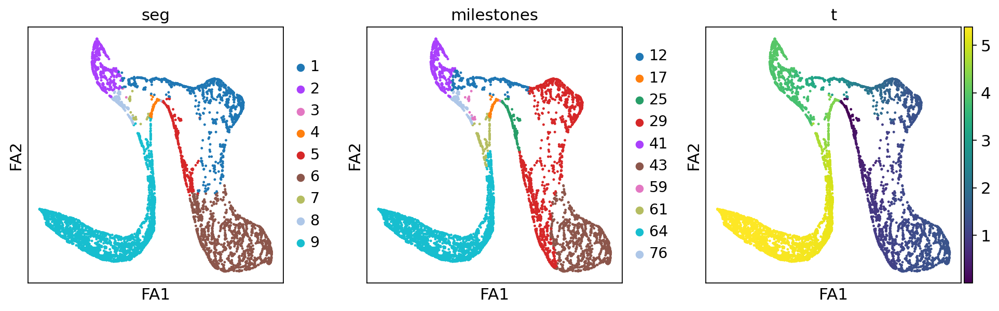

In [61]:
sc.pl.draw_graph(adata,color=["seg","milestones","t"])

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

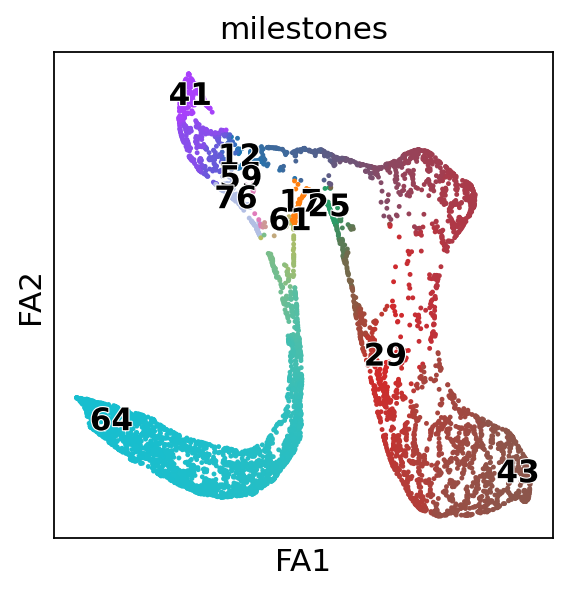

In [62]:
scf.pl.milestones(adata,annotate=True)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


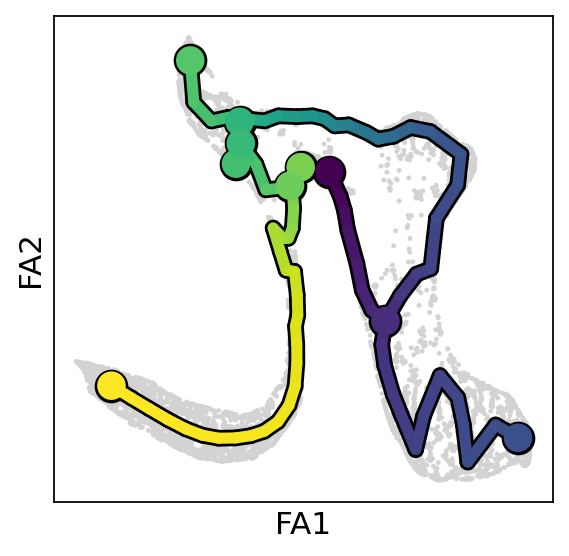

In [63]:
scf.pl.trajectory(adata)

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


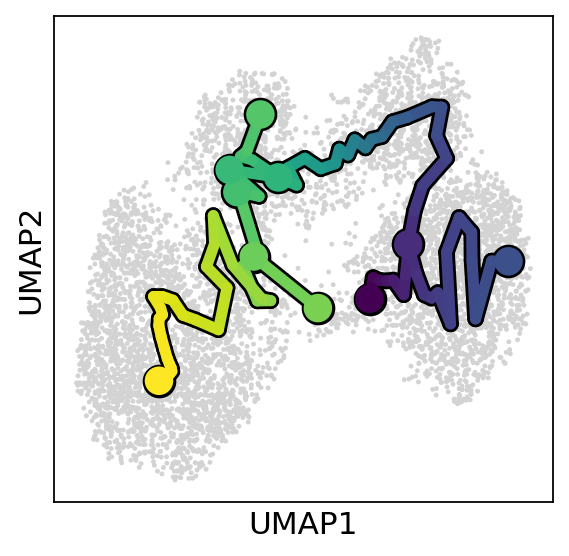

In [64]:
scf.pl.trajectory(adata, basis='umap')

In [65]:
adata.write('/storage/users/data/PANC/H5AD_file/IV_adata_filtered_no2D_hvg_clust_time2.h5ad')

In [66]:
adata = sc.read("/storage/users/data/PANC/H5AD_file/IV_adata_filtered_no2D_hvg_clust_time2.h5ad")

In [67]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 'neighbors', 'pca', 'ppt', 'pseudotime_list', 'seg_colors', 'umap'
    obsm: 'X_R', 'X_draw_graph_fa', 'X_palantir', 

## Dendrogram representation

In [68]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 'neighbors', 'pca', 'ppt', 'pseudotime_list', 'seg_colors', 'umap'
    obsm: 'X_R', 'X_draw_graph_fa', 'X_palantir', 

In [69]:
scf.tl.dendrogram(adata)

Generating dendrogram of tree
    segment : 100%|██████████| 9/9 [00:33<00:00,  3.78s/it]
    finished (0:00:34) --> added 
    .obsm['X_dendro'], new embedding generated.
    .uns['dendro_segments'] tree segments used for plotting.


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Generic family 'sans-serif' not found because

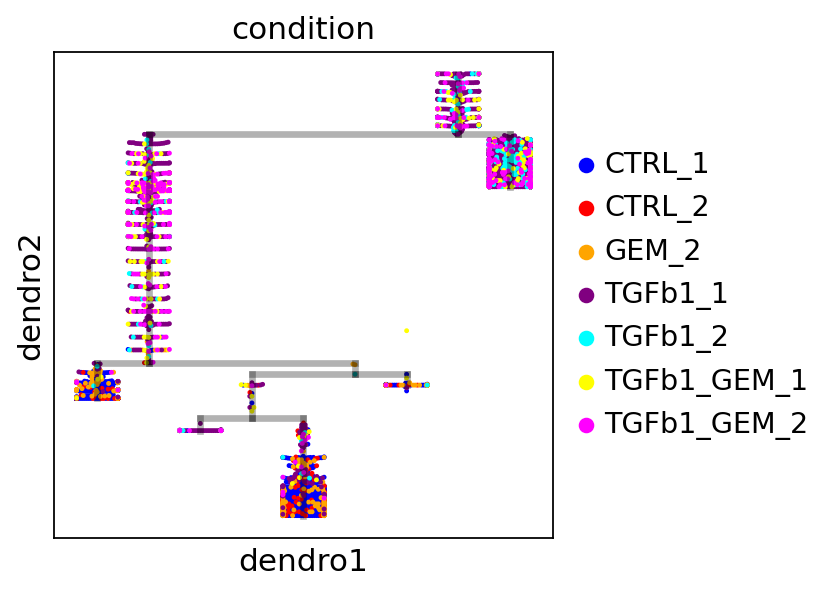

In [70]:
scf.pl.dendrogram(adata,color="condition")

In [71]:
plt.rcParams['font.family'] = 'DejaVu Sans'

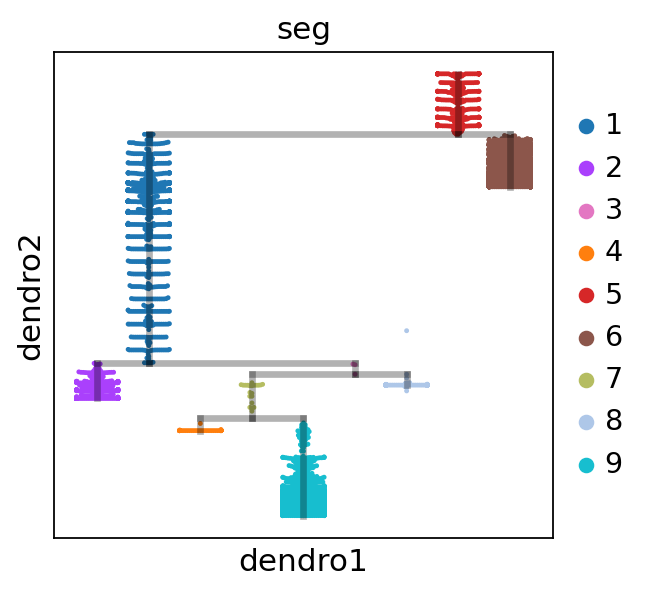

In [72]:
scf.pl.dendrogram(adata,color="seg")

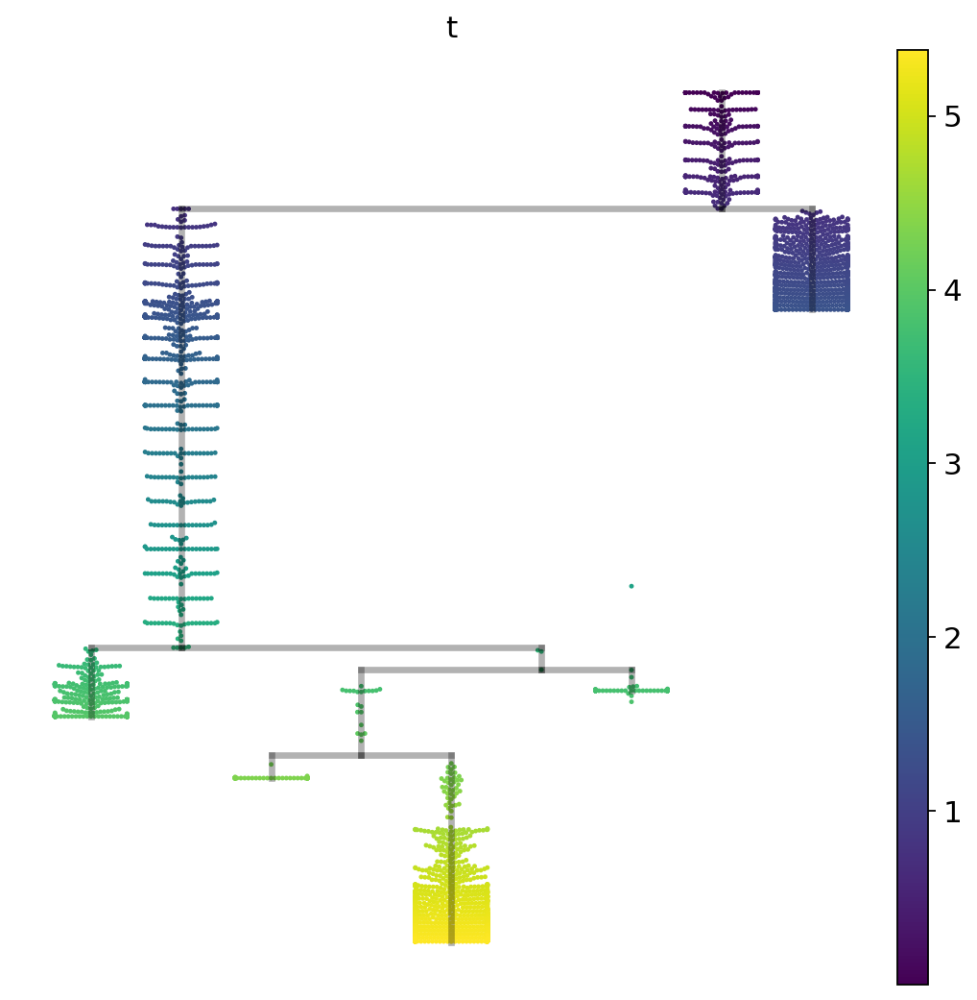

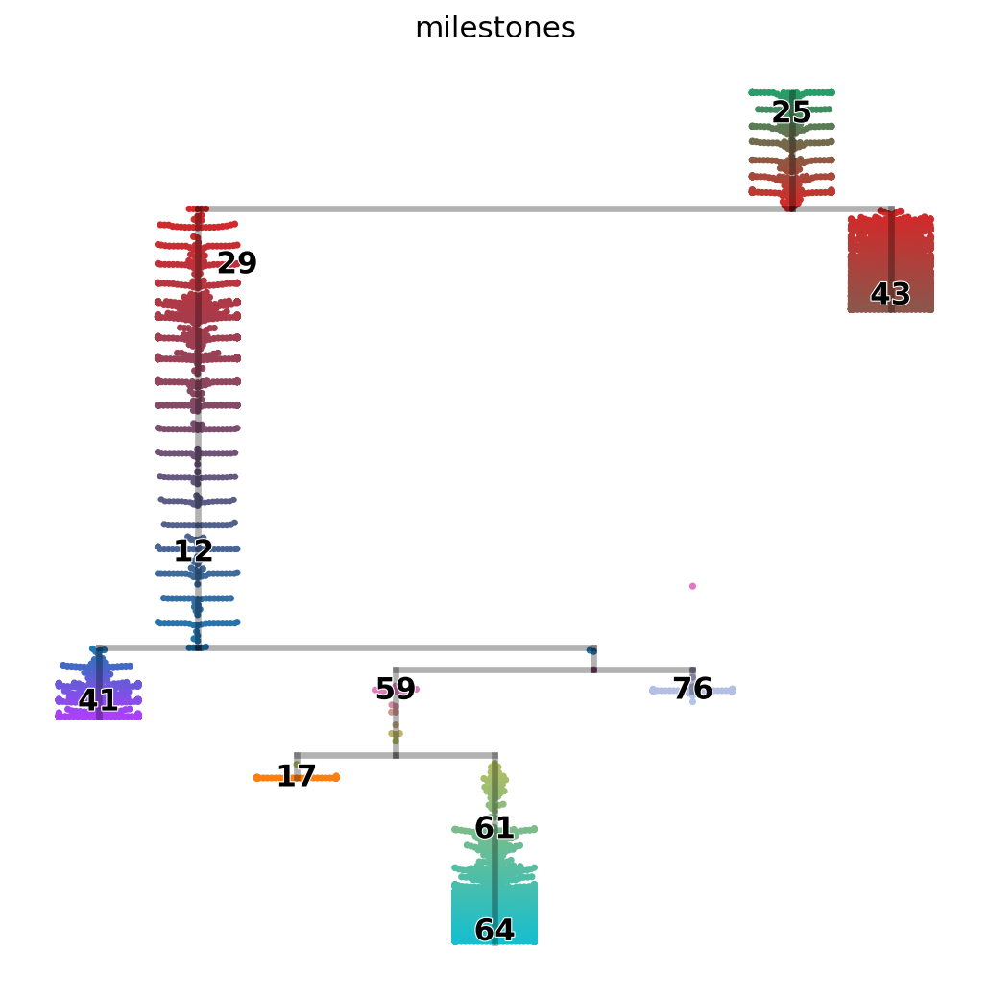

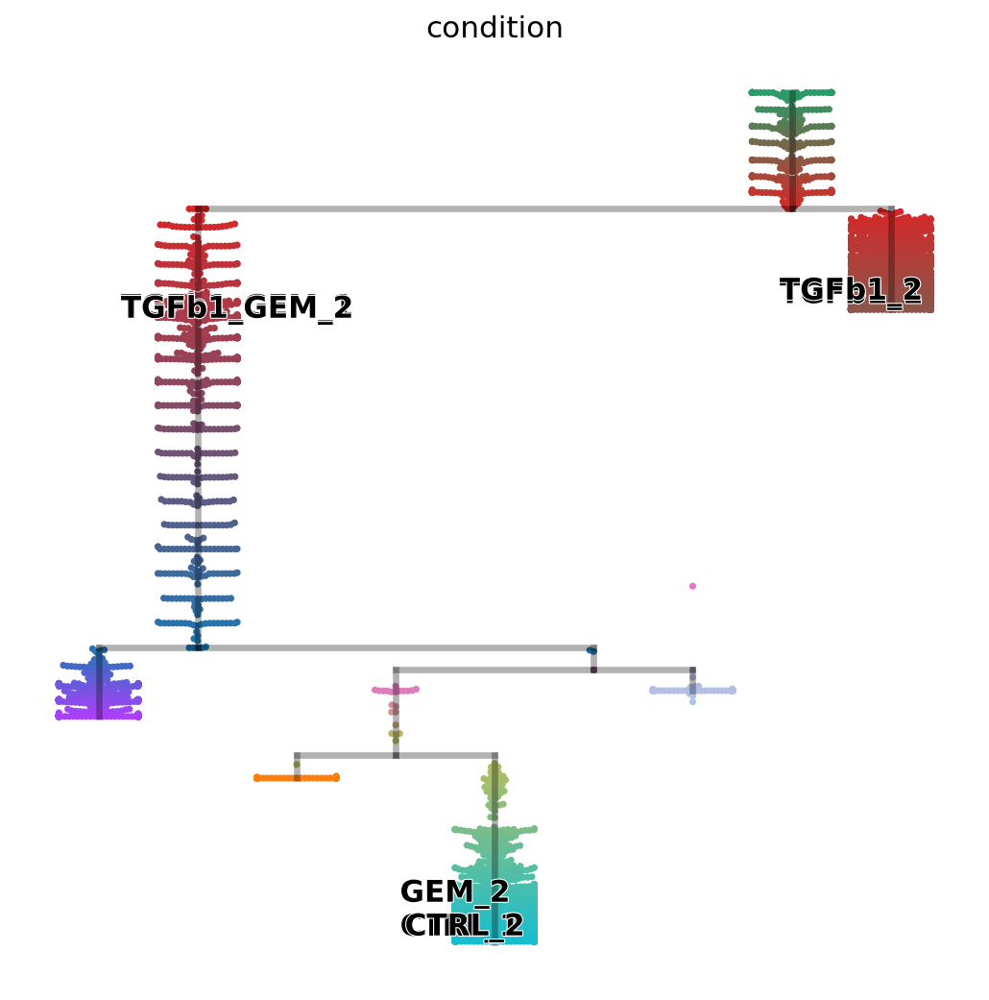

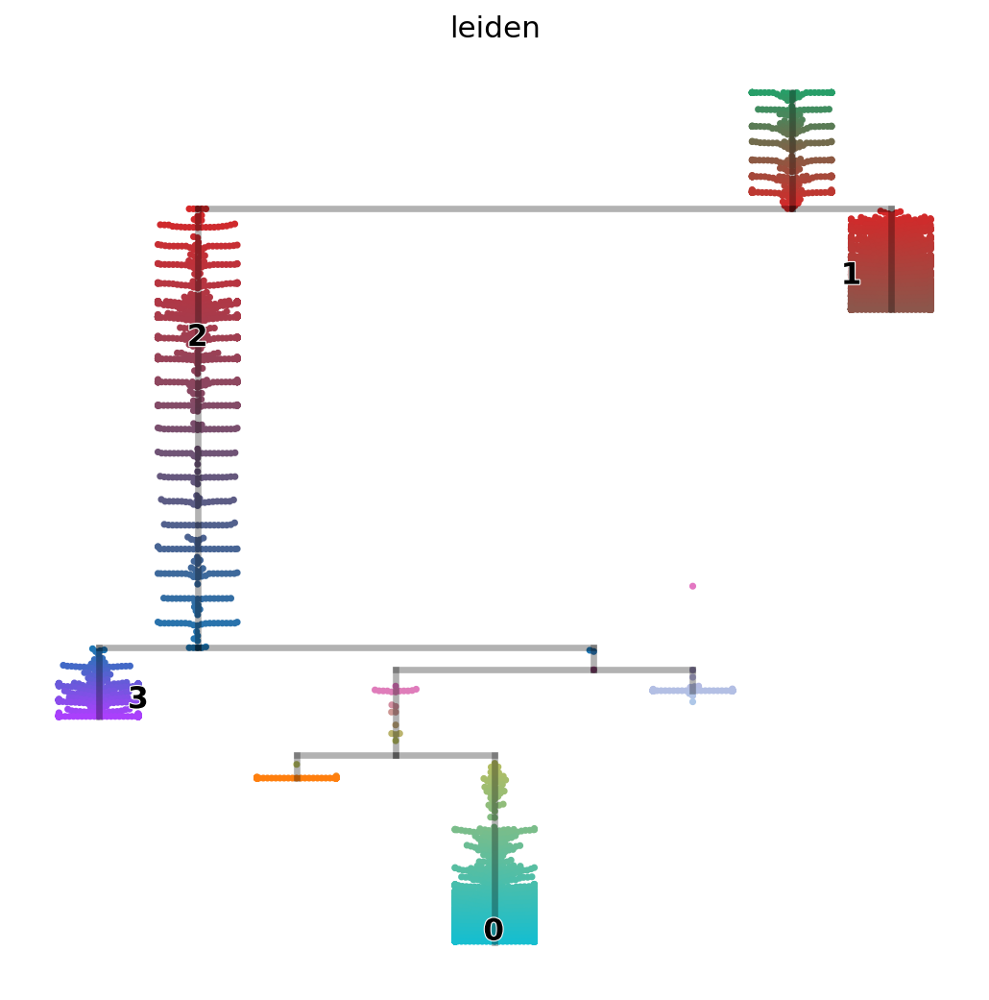

In [73]:
sc.set_figure_params(figsize=(8,8),frameon=False,dpi_save=300)
scf.pl.dendrogram(adata,color="t",show_info=True,save="B1.pdf",cmap="viridis")
scf.pl.dendrogram(adata,color="milestones",legend_loc="on data",color_milestones=True,legend_fontoutline=True,save="B2.pdf")
scf.pl.dendrogram(adata,color="condition",legend_loc="on data",color_milestones=True,legend_fontoutline=True,save="B2.pdf")
scf.pl.dendrogram(adata,color="leiden",legend_loc="on data",color_milestones=True,legend_fontoutline=True,save="B2.pdf")

# Linear deviation of genes from a selected trajectory

In [74]:
adata.write("/storage/users/data/PANC/H5AD_file/IV_adata_filtered_no2D_hvg_clust_time3.h5ad")

In [75]:
adata = sc.read("/storage/users/data/PANC/H5AD_file/IV_adata_filtered_no2D_hvg_clust_time3.h5ad")

In [76]:
plt.rcParams['font.family'] = 'DejaVu Sans'

In [77]:
#adata.var_names
adata.var['gene_symbol']

feature_id
ENSG00000187608       ISG15
ENSG00000224969            
ENSG00000184163    C1QTNF12
ENSG00000142609      CFAP74
ENSG00000287586            
                     ...   
ENSG00000067842      ATP2B3
ENSG00000130821      SLC6A8
ENSG00000198910       L1CAM
ENSG00000099721       AMELY
ENSG00000198899     MT-ATP6
Name: gene_symbol, Length: 1992, dtype: category
Categories (1632, object): ['', 'AASS', 'ABCA1', 'ABCA9', ..., 'ZNF827', 'ZSWIM6', 'ZWINT', 'unknown']

In [78]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'dendro_segments', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 'neighbors', 'pca', 'ppt', 'pseudotime_list', 'seg_colors', 'umap'
    obsm: 'X_R', 'X_dendro', 'X

In [79]:
help(scf.tl.linearity_deviation)

Help on function linearity_deviation in module scFates.tools.linearity_deviation:

linearity_deviation(adata: anndata._core.anndata.AnnData, start_milestone, end_milestone, percentiles=[20, 80], n_jobs: int = 1, n_map: int = 1, plot: bool = False, basis: str = 'X_umap', copy: bool = False)
    Identifies genes that specifically characterize a given transition but not the progenitors neither the progenies.
    
    This approach has been developped in the following study [Kameneva21]_.
    Designed to test whether a bridge/transition is the result of a doublet population only, this test checks if a gene expression occuring in the transition/bridge could be explained by a linear mixture of expressions of that gene in progenitors and progenies. The gene expression profile of each cell of the bridge is modeled as a linear combination of mean gene expression profiles in progenitors and progenies.
    
    For each gene in each cell in bridge is calculated the magnitude of the residuals not 

In [85]:
print(adata.obs['milestones'].unique())  # Check the unique milestone values


['64', '76', '41', '12', '59', '29', '61', '43', '25', '17']
Categories (10, object): ['12', '17', '25', '29', ..., '59', '61', '64', '76']


Estimation of deviation from linearity
    cells on the bridge: 100%|██████████| 1856/1856 [00:03<00:00, 574.67it/s]


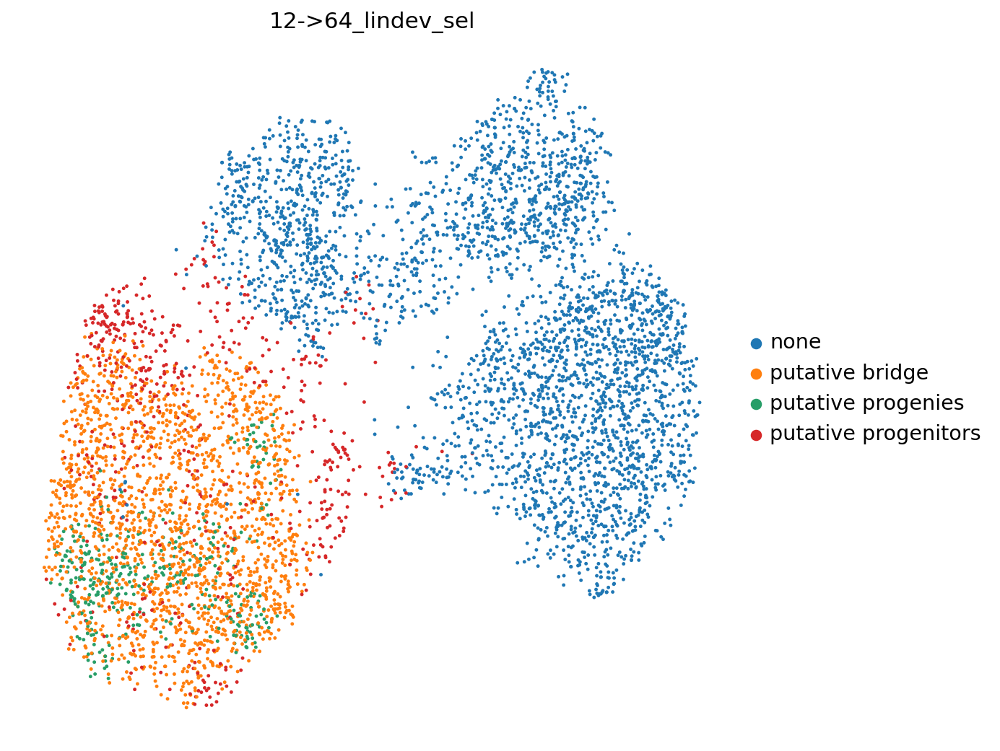

    finished (0:00:04) --> added 
    .var['12->64_rss'], pearson residuals of the linear fit.
    .obs['12->64_lindev_sel'], cell selections used for the test.


In [86]:
scf.tl.linearity_deviation(adata,
                           start_milestone="12",
                           end_milestone="64",
                           n_jobs=10,plot=True,basis="umap")

In [88]:
adata.obs['12->64_lindev_sel']

barcode
AAACCCAGTAGGCTCC-1         putative bridge
AAACCCAGTCGCAACC-1    putative progenitors
AAACCCATCCACAAGT-1    putative progenitors
AAACGCTTCACTACGA-1         putative bridge
AAAGAACAGATACAGT-1         putative bridge
                              ...         
TTTACTGTCATTACTC-1                    none
TTTCACAGTGATATAG-1                    none
TTTCACATCGATGCAT-1                    none
TTTCATGTCCCTCTAG-1                    none
TTTGACTGTTCCGGTG-1                    none
Name: 12->64_lindev_sel, Length: 6235, dtype: category
Categories (4, object): ['none', 'putative bridge', 'putative progenies', 'putative progenitors']

In [89]:
cell_counts = adata.obs['12->64_lindev_sel'].value_counts()[["putative bridge", "putative progenies", "putative progenitors"]]

In [90]:
cell_counts

12->64_lindev_sel
putative bridge         1856
putative progenies       381
putative progenitors     596
Name: count, dtype: int64

In [91]:
adata.obs.milestones

barcode
AAACCCAGTAGGCTCC-1    64
AAACCCAGTCGCAACC-1    64
AAACCCATCCACAAGT-1    64
AAACGCTTCACTACGA-1    64
AAAGAACAGATACAGT-1    64
                      ..
TTTACTGTCATTACTC-1    17
TTTCACAGTGATATAG-1    29
TTTCACATCGATGCAT-1    29
TTTCATGTCCCTCTAG-1    29
TTTGACTGTTCCGGTG-1    29
Name: milestones, Length: 6235, dtype: category
Categories (10, object): ['12', '17', '25', '29', ..., '59', '61', '64', '76']

In [99]:
plt.rcParams['font.family'] = 'DejaVu Sans'
sc.settings.set_figure_params(dpi=100, dpi_save=150, figsize=(4, 4))

In [100]:
bdata = adata.copy()
bdata.var_names = bdata.var['gene_symbol']

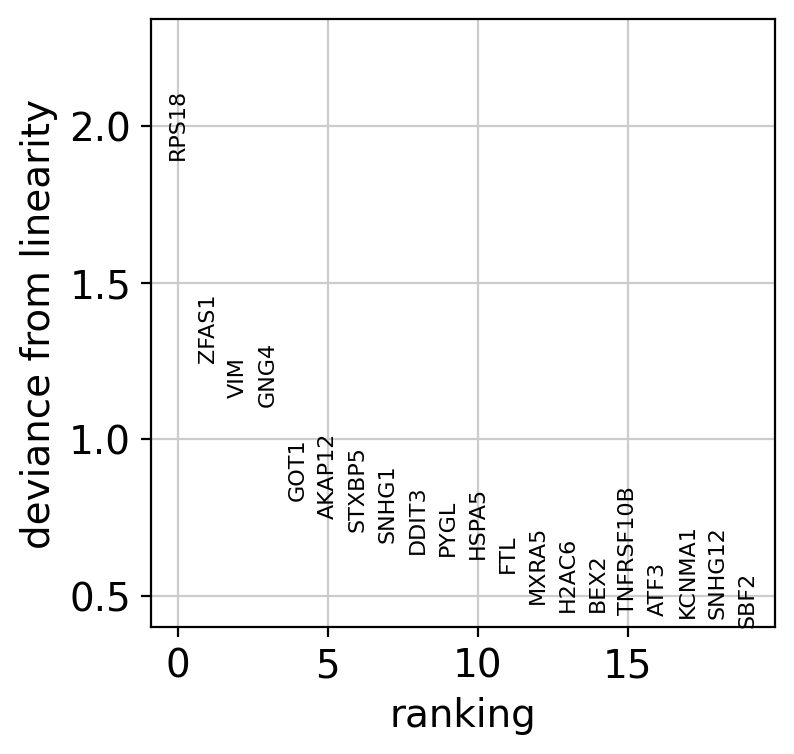

In [101]:
#adata.var['gene_symbol']

bdata.var_names = bdata.var['gene_symbol']
scf.pl.linearity_deviation(bdata,
                           start_milestone="12",
                           end_milestone="64", ntop_genes=20)

In [95]:
print(adata.var_names[:10])

Index(['ENSG00000187608', 'ENSG00000224969', 'ENSG00000184163',
       'ENSG00000142609', 'ENSG00000287586', 'ENSG00000049246',
       'ENSG00000238290', 'ENSG00000204624', 'ENSG00000117122',
       'ENSG00000117115'],
      dtype='object', name='feature_id')


In [96]:
print(bdata.var_names[:10])

CategoricalIndex(['ISG15', '', 'C1QTNF12', 'CFAP74', '', 'PER3', 'ERRFI1-DT',
                  'DISP3', 'MFAP2', 'PADI2'],
                 categories=['', 'AASS', 'ABCA1', 'ABCA9', ..., 'ZNF827', 'ZSWIM6', 'ZWINT', 'unknown'], ordered=False, dtype='category', name='gene_symbol')


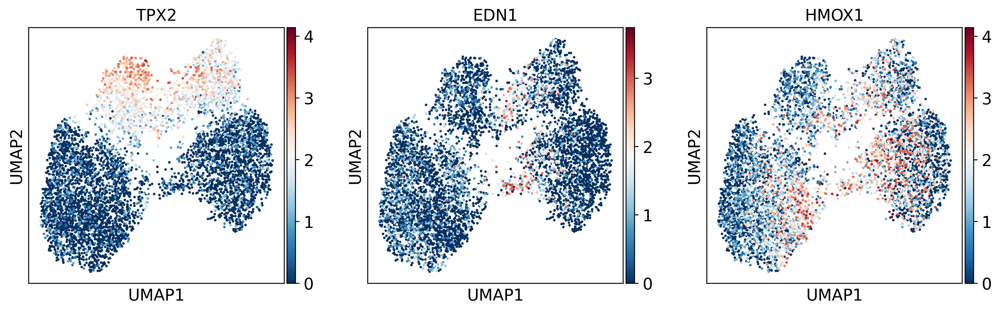

In [97]:
sc.pl.umap(bdata,color=['TPX2','EDN1','HMOX1'],cmap="RdBu_r")

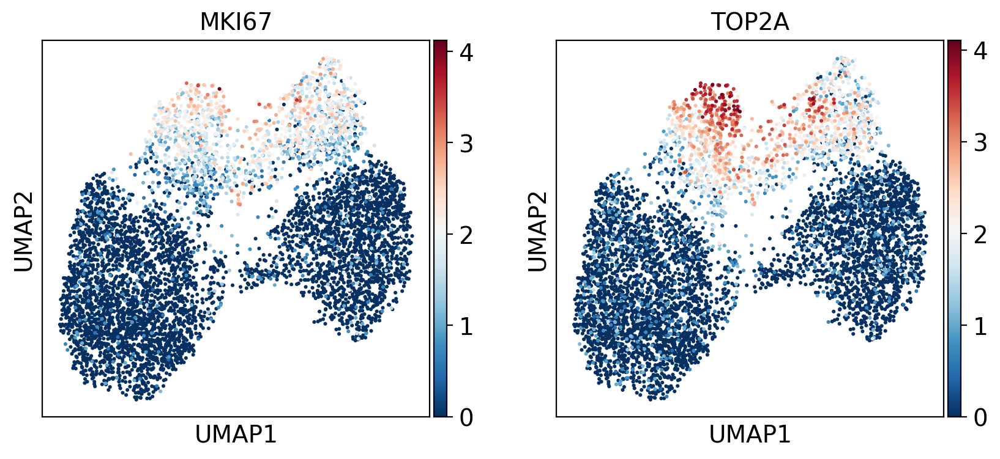

In [107]:
sc.pl.umap(bdata,color=['MKI67','TOP2A'],cmap="RdBu_r")

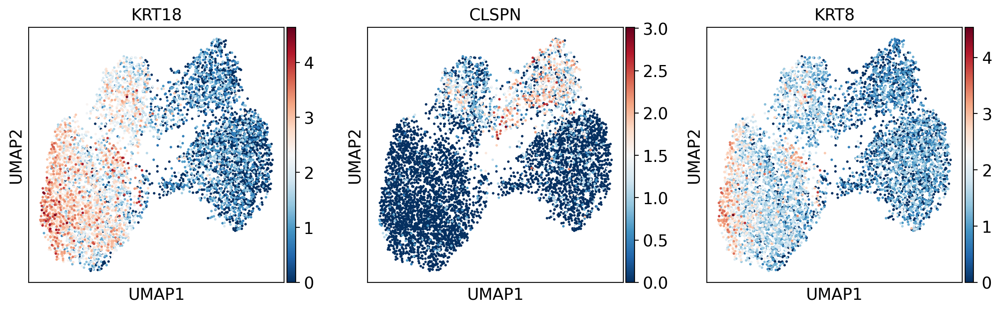

In [112]:
sc.pl.umap(bdata,color=['KRT18','CLSPN','KRT8',],cmap="RdBu_r")

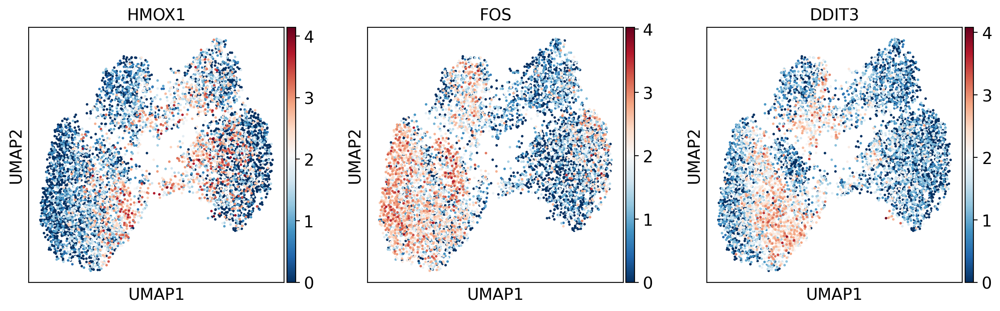

In [117]:
sc.pl.umap(bdata,color=['HMOX1','FOS','DDIT3'],cmap="RdBu_r")

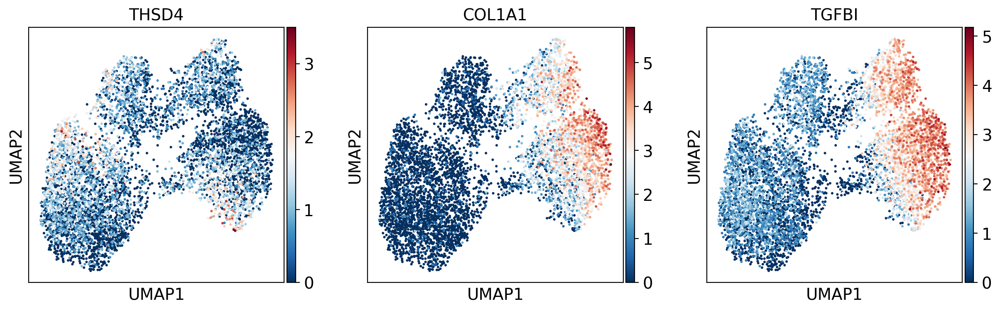

In [105]:
sc.pl.umap(bdata,color=['THSD4','COL1A1','TGFBI'],cmap="RdBu_r")

In [122]:
#adata.var['43->139_rss']
bdata.var.sort_values(by='12->64_rss', ascending=False)

,n_cells_by_counts,mean_counts,log1p_mean_counts,pct_dropout_by_counts,total_counts,log1p_total_counts,CMO,gene_symbol,mito,ribo,n_cells,highly_variable,means,dispersions,dispersions_norm,12->64_rss
gene_symbol,,,,,,,,,,,,,,,,
RPS18,11546,122.703583,4.817888,3.129457,1462504,14.195661,False,RPS18,False,True,10355,True,4.996527,3.299052,1.355255,1.891796
ZFAS1,11112,23.902089,3.214952,6.770702,284889,12.559858,False,ZFAS1,False,False,10346,True,3.564352,2.648432,1.563020,1.244689
VIM,11520,79.519926,4.388505,3.347596,947798,13.761898,False,VIM,False,False,10364,True,4.697006,3.137816,1.458399,1.132697
GNG4,3500,0.896720,0.640126,70.635120,10688,9.276970,False,GNG4,False,False,3345,True,0.988115,1.495764,1.824157,1.104890
GOT1,7077,1.670023,0.982087,40.624213,19905,9.898776,False,GOT1,False,False,6736,True,1.136721,1.448788,1.708562,0.805857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
OTUD6A,11,0.000923,0.000922,99.907710,11,2.484907,False,OTUD6A,False,False,10,True,0.000904,1.110586,2.419314,NaN
SASH3,10,0.001510,0.001509,99.916100,18,2.944439,False,SASH3,False,False,10,True,0.003058,2.172219,5.912002,NaN
,6,0.000503,0.000503,99.949660,6,1.945910,False,,False,False,6,True,0.001023,1.181654,2.653121,NaN


In [124]:
sorted_var = bdata.var.sort_values('12->64_rss', ascending=False)
print(sorted_var.head(5))

             n_cells_by_counts  mean_counts  log1p_mean_counts  \
gene_symbol                                                      
RPS18                    11546   122.703583           4.817888   
ZFAS1                    11112    23.902089           3.214952   
VIM                      11520    79.519926           4.388505   
GNG4                      3500     0.896720           0.640126   
GOT1                      7077     1.670023           0.982087   

             pct_dropout_by_counts  total_counts  log1p_total_counts    CMO  \
gene_symbol                                                                   
RPS18                     3.129457       1462504           14.195661  False   
ZFAS1                     6.770702        284889           12.559858  False   
VIM                       3.347596        947798           13.761898  False   
GNG4                     70.635120         10688            9.276970  False   
GOT1                     40.624213         19905            9.8

In [125]:
#add your path
adata.write("/storage/users/data/PANC/H5AD_file/IV_time_adata_no_2D_lindev.h5ad")

In [126]:
adata = sc.read("/storage/users/data/PANC/H5AD_file/IV_time_adata_no_2D_lindev.h5ad")
#adata = sc.read("../../data//time_adata_no_2D_lindev.h5ad")

In [127]:
adata

AnnData object with n_obs × n_vars = 6235 × 1992
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones', '12->64_lindev_sel'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', '12->64_rss'
    uns: '12->64_lindev_sel_colors', 'condition_colors', 'dendro_segments', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 'neighbors', 'pca', 'ppt', 'pseudot

# Significantly changing feature along pseudotime test

In [128]:
adata.var_names

Index(['ENSG00000187608', 'ENSG00000224969', 'ENSG00000184163',
       'ENSG00000142609', 'ENSG00000287586', 'ENSG00000049246',
       'ENSG00000238290', 'ENSG00000204624', 'ENSG00000117122',
       'ENSG00000117115',
       ...
       'ENSG00000013619', 'ENSG00000029993', 'ENSG00000011677',
       'ENSG00000198883', 'ENSG00000182492', 'ENSG00000067842',
       'ENSG00000130821', 'ENSG00000198910', 'ENSG00000099721',
       'ENSG00000198899'],
      dtype='object', name='feature_id', length=1992)

In [131]:
scf.tl.test_association(adata, spline_df=3, n_jobs=4)


test features for association with the trajectory
    single mapping : 100%|██████████| 1992/1992 [02:34<00:00, 12.90it/s]
    found 491 significant features (0:02:34) --> added
    .var['p_val'] values from statistical test.
    .var['fdr'] corrected values from multiple testing.
    .var['st'] proportion of mapping in which feature is significant.
    .var['A'] amplitue of change of tested feature.
    .var['signi'] feature is significantly changing along pseudotime.
    .uns['stat_assoc_list'] list of fitted features on the graph for all mappings.


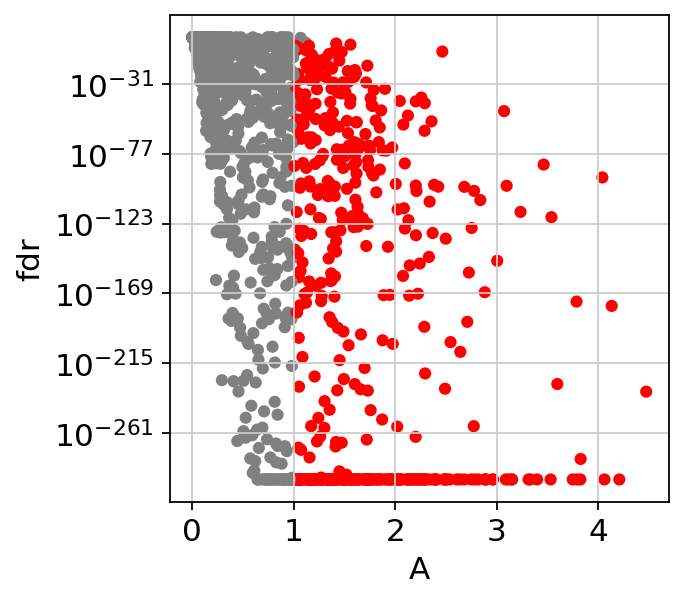

In [132]:
sc.set_figure_params()
scf.pl.test_association(adata)
plt.savefig("figures/C.pdf",dpi=300)

In [134]:
#adata.write('../../data/time_adata.h5ad')
adata.write("/storage/users/data/PANC/H5AD_file/IV_time_adata_no_2D_lindev_sign.h5ad")

In [135]:
adata = sc.read("/storage/users/data/PANC/H5AD_file/IV_time_adata_no_2D_lindev_sign.h5ad")
#adata = sc.read("../../data//time_adata.h5ad")

## Fitting & clustering significant features

### fitting and filtering

In [136]:
scf.tl.fit(adata,n_jobs=10)

fit features associated with the trajectory
    single mapping : 100%|██████████| 491/491 [00:57<00:00,  8.55it/s]
    finished (adata subsetted to keep only fitted features!) (0:00:58) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.


fit features associated with the trajectory
    single mapping : 100%|██████████| 3393/3393 [03:13<00:00, 17.51it/s]
    finished (adata subsetted to keep only fitted features!) (0:03:19) --> added
    .layers['fitted'], fitted features on the trajectory for all mappings.
    .raw, unfiltered data.

In [137]:
adata

AnnData object with n_obs × n_vars = 6235 × 491
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones', '12->64_lindev_sel'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', '12->64_rss', 'p_val', 'A', 'fdr', 'st', 'signi'
    uns: '12->64_lindev_sel_colors', 'condition_colors', 'dendro_segments', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 

In [138]:
help(scf.tl.fit)

Help on function fit in module scFates.tools.fit:

fit(adata: anndata._core.anndata.AnnData, features: Optional[Iterable] = None, layer: Optional[str] = None, n_map: int = 1, n_jobs: int = 1, gamma: float = 1.5, save_raw: bool = True, copy: bool = False)
    Model feature expression levels as a function of tree positions.
    
    The models are fit using *mgcv* R package. Note that since adata can currently only keep the
    same dimensions for each of its layers. While the dataset is subsetted to keep only significant
    feratures, the unsubsetted dataset is kept in adata.raw (save_raw parameter).
    
    
    Parameters
    ----------
    adata
        Annotated data matrix.
    layer
        adata layer to use for the fitting.
    n_map
        number of cell mappings from which to do the test.
    n_jobs
        number of cpu processes used to perform the test.
    gamma
        stringency of penalty.
    saveraw
        save the unsubsetted anndata to adata.raw
    copy
       

In [139]:
adata.layers['fitted']

array([[0.40496035, 0.19180946, 0.39955974, ..., 1.61011225, 0.2684025 ,
        3.5045192 ],
       [0.54549452, 0.10951098, 0.30665972, ..., 0.86259672, 0.31497474,
        3.46750002],
       [0.47301949, 0.13280559, 0.33762541, ..., 1.10258792, 0.28681154,
        3.48370583],
       ...,
       [0.5483254 , 0.64118374, 0.53536651, ..., 1.54444515, 0.35443202,
        2.97455698],
       [0.46144471, 0.82063437, 0.85084646, ..., 0.54996128, 0.58569645,
        3.2194852 ],
       [0.46626873, 1.00938948, 0.83876712, ..., 1.30527734, 0.6172772 ,
        3.21690733]])

In [140]:
adata.var_names

Index(['ENSG00000187608', 'ENSG00000117122', 'ENSG00000162545',
       'ENSG00000142798', 'ENSG00000117318', 'ENSG00000175793',
       'ENSG00000253368', 'ENSG00000197989', 'ENSG00000159023',
       'ENSG00000162510',
       ...
       'ENSG00000130066', 'ENSG00000147065', 'ENSG00000090889',
       'ENSG00000147099', 'ENSG00000230590', 'ENSG00000102271',
       'ENSG00000003096', 'ENSG00000029993', 'ENSG00000198910',
       'ENSG00000198899'],
      dtype='object', name='feature_id', length=491)

In [141]:
#adata.write('../../data/time_adata_filt.h5ad')
adata.write("/storage/users/data/PANC/H5AD_file/IV_time_adata_no_2D_lindev_sign_fit.h5ad")

In [142]:
adata = sc.read("/storage/users/data/PANC/H5AD_file/IV_time_adata_no_2D_lindev_sign_fit.h5ad")
#adata = sc.read("../../data//time_adata_filt.h5ad")

In [143]:
bdata = adata.copy()
bdata.var_names = bdata.var['gene_symbol']

In [144]:
sorted_var = bdata.var.sort_values('12->64_rss', ascending=False)
print(sorted_var.head(5))

             n_cells_by_counts  mean_counts  log1p_mean_counts  \
gene_symbol                                                      
RPS18                    11546   122.703583           4.817888   
ZFAS1                    11112    23.902089           3.214952   
VIM                      11520    79.519926           4.388505   
GNG4                      3500     0.896720           0.640126   
GOT1                      7077     1.670023           0.982087   

             pct_dropout_by_counts  total_counts  log1p_total_counts    CMO  \
gene_symbol                                                                   
RPS18                     3.129457       1462504           14.195661  False   
ZFAS1                     6.770702        284889           12.559858  False   
VIM                       3.347596        947798           13.761898  False   
GNG4                     70.635120         10688            9.276970  False   
GOT1                     40.624213         19905            9.8

### Clustering

In [145]:
adata

AnnData object with n_obs × n_vars = 6235 × 491
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones', '12->64_lindev_sel'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', '12->64_rss', 'p_val', 'A', 'fdr', 'st', 'signi'
    uns: '12->64_lindev_sel_colors', 'condition_colors', 'dendro_segments', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'milestones_colors', 

In [146]:
bdata = adata.copy()
bdata.var_names = bdata.var['gene_symbol']

In [147]:
help(scf.tl.cluster)

Help on function cluster in module scFates.tools.cluster:

cluster(adata: anndata._core.anndata.AnnData, layer='fitted', n_neighbors: int = 20, n_pcs: int = 50, metric: str = 'cosine', resolution: float = 1, device: str = 'cpu', copy: bool = False)
    Cluster features. Uses scanpy backend when using cpu, and cuml when using gpu.
    Dataset is transposed, PCA is calulcated and a nearest neighbor graph is generated
    from PC space. Leiden algorithm is used for community detection.
    
    
    Parameters
    ----------
    adata
        Annotated data matrix.
    layer
        Layer of feature to calculate clusters, by default fitted features
    n_neighbors
        Number of neighbors.
    n_pcs
        Number of PC to keep for PCA.
    metric
        distance metric to use for clustering.
    resolution
        Resolution parameter for leiden algorithm.
    device
        run the analysis on 'cpu' with phenograph, or on 'gpu' with grapheno.
    
    copy
        Return a copy inst

In [148]:
scf.tl.cluster(adata,n_neighbors=50,metric="correlation")

Clustering features using fitted layer
computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
    finished (0:00:02) --> added 
    .var['clusters'] identified modules.


In [149]:
adata

AnnData object with n_obs × n_vars = 6235 × 491
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones', '12->64_lindev_sel'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', '12->64_rss', 'p_val', 'A', 'fdr', 'st', 'signi', 'clusters'
    uns: '12->64_lindev_sel_colors', 'condition_colors', 'dendro_segments', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'mileston

In [150]:
adata.var.clusters.unique()

['1', '0', '7', '2', '6', '3', '4', '5']
Categories (8, object): ['0', '1', '2', '3', '4', '5', '6', '7']

In [151]:
bdata = adata.copy()
bdata.var_names = bdata.var['gene_symbol']

In [152]:
## make trivial names unique
bdata.var_names = bdata.var_names.astype(str)
bdata.var_names_make_unique()

#### Plot trend of clusters

In [154]:
# plotting paramters
plt.rcParams['font.family'] = 'DejaVu Sans'
sc.settings.set_figure_params(dpi=100, dpi_save=150, figsize=(4, 4))

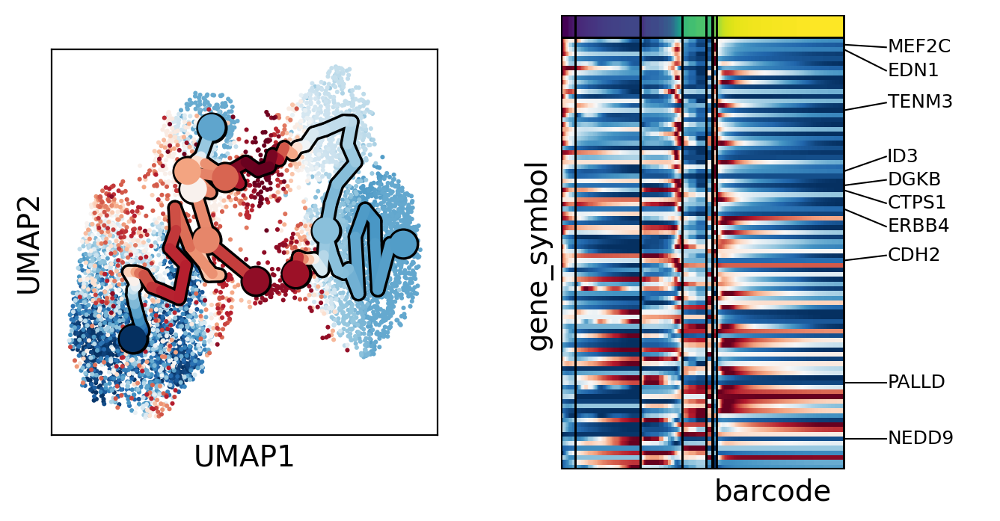

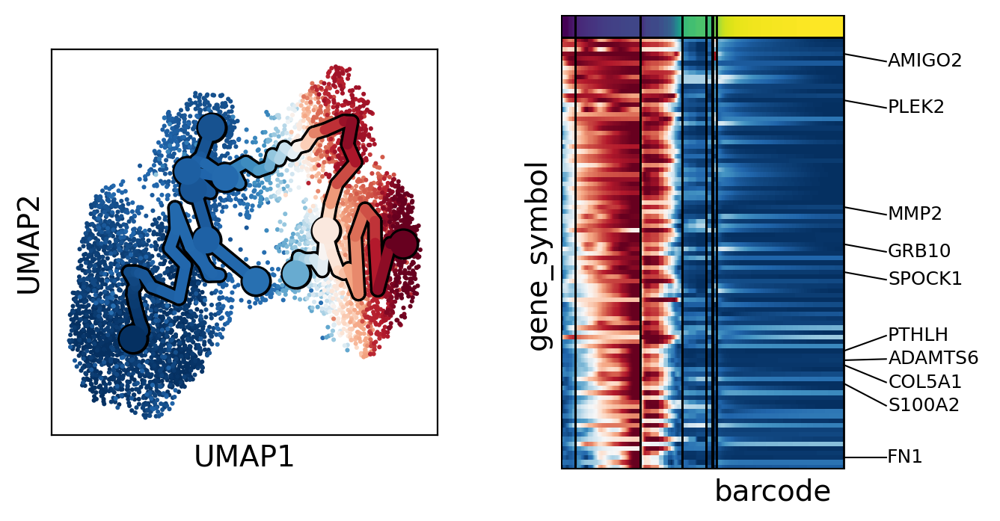

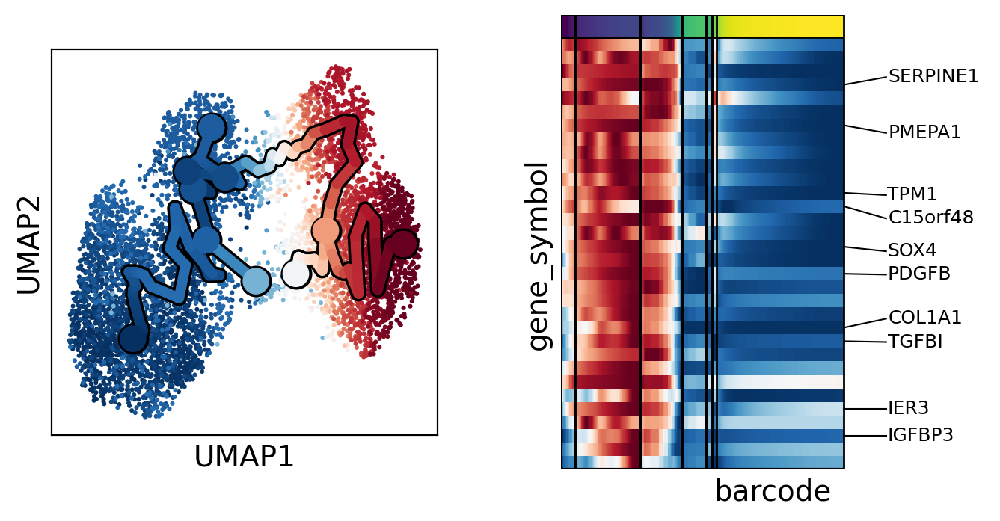

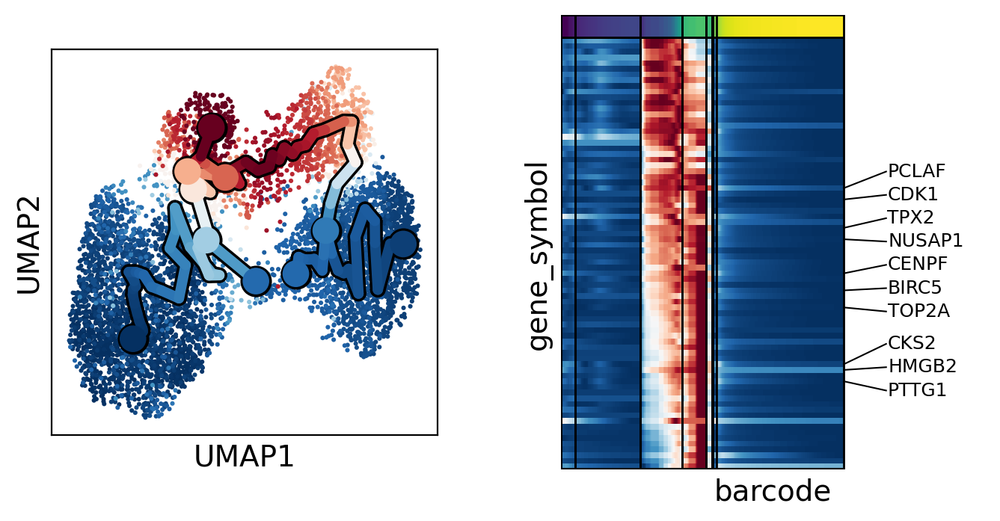

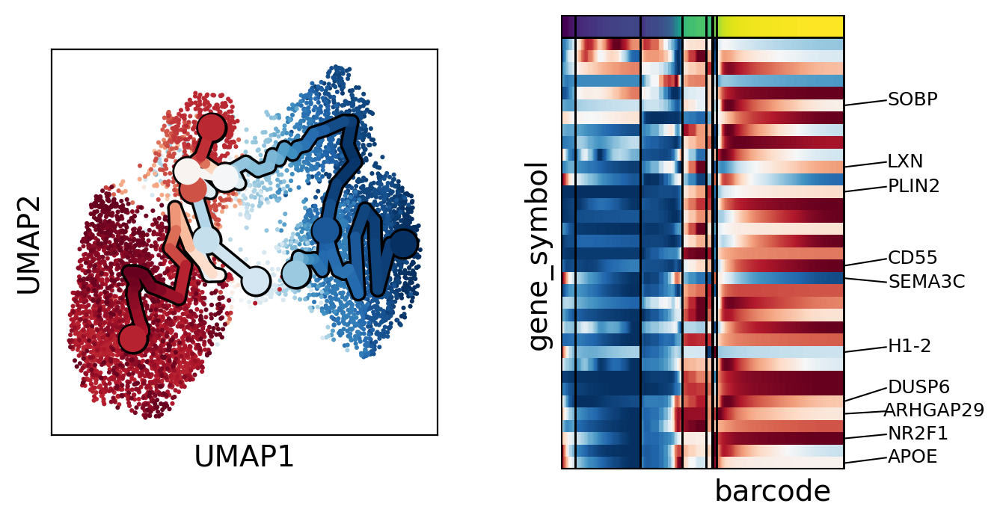

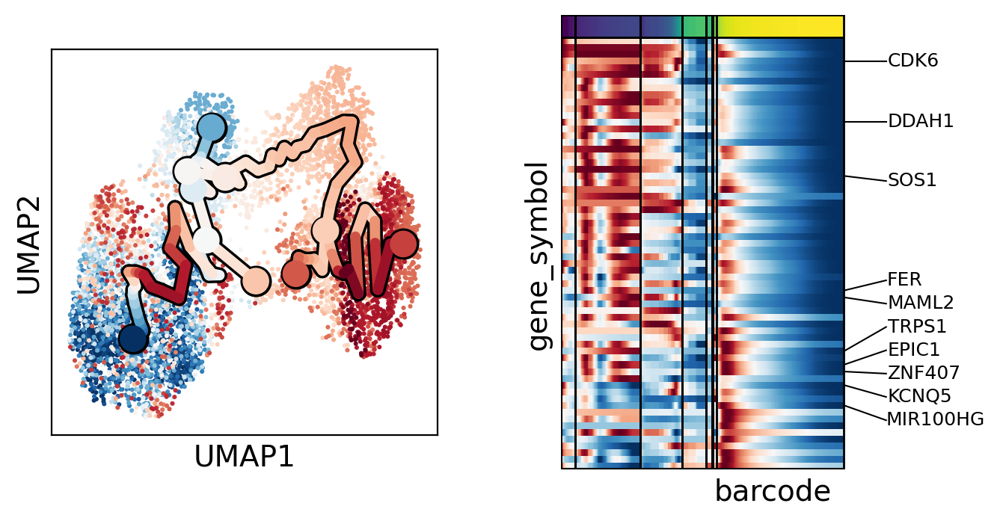

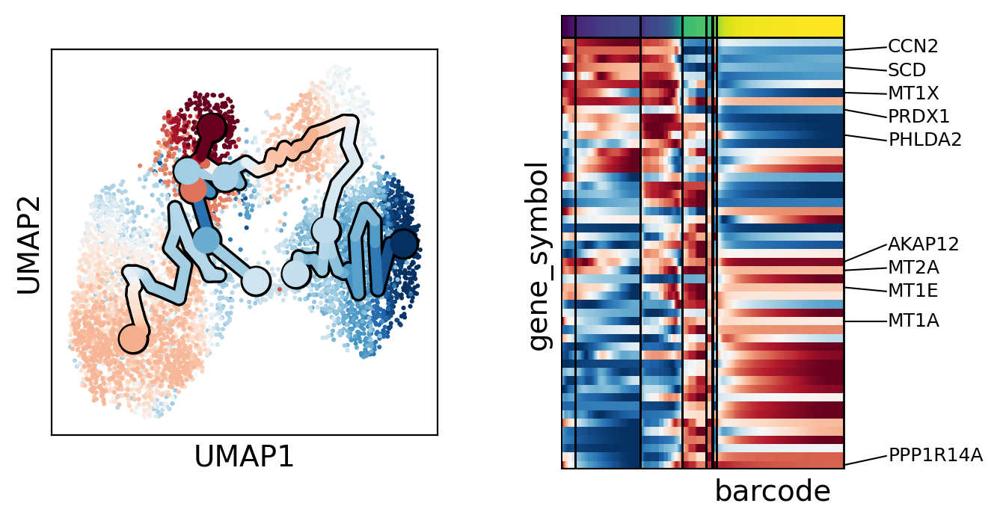

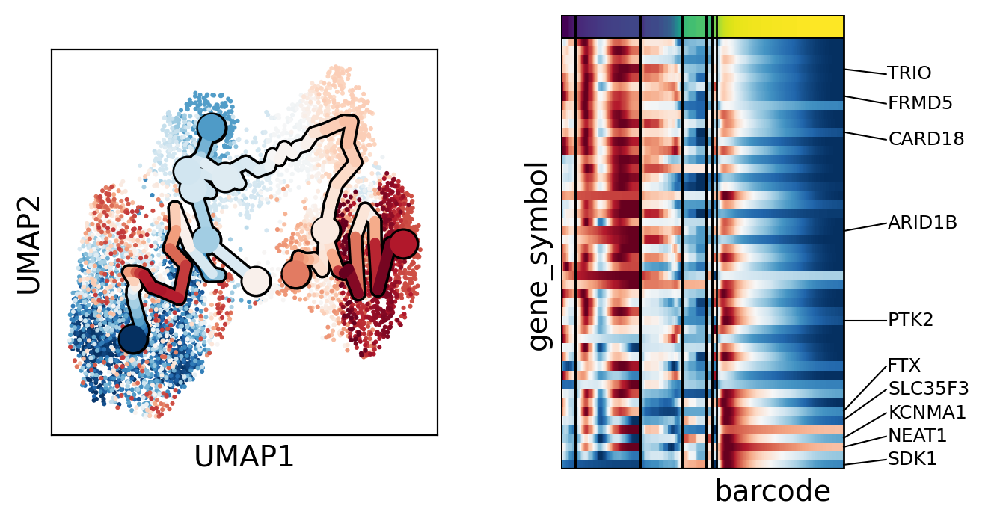

In [155]:
for c in bdata.var["clusters"].unique():
    scf.pl.trends(bdata,features=bdata.var_names[bdata.var.clusters==c],basis="umap")

#### Plot trend of single genes

In [156]:
help(scf.pl.trends)

Help on function trends in module scFates.plot.features:

trends(adata: anndata._core.anndata.AnnData, features=None, cluster=None, highlight_features: Union[List, Literal['A', 'fdr']] = 'A', n_features: int = 10, root_milestone: Optional[str] = None, milestones: Optional[str] = None, module: Optional[Literal['early', 'late']] = None, branch: Optional[str] = None, annot: Optional[str] = None, title: str = '', feature_cmap: str = 'RdBu_r', pseudo_cmap: str = 'viridis', plot_emb: bool = True, plot_heatmap: bool = True, wspace: Optional[float] = None, show_segs: bool = True, basis: Optional[str] = None, heatmap_space: float = 0.5, offset_names: float = 0.15, fontsize: int = 9, style: Literal['normal', 'italic', 'oblique'] = 'normal', ordering: Optional[Literal['pearson', 'spearman', 'quantile', 'max']] = 'pearson', ord_thre=0.7, figsize: Optional[tuple] = None, axemb=None, show: Optional[bool] = None, output_mean: bool = False, save: Union[str, bool, NoneType] = None, return_genes: Option

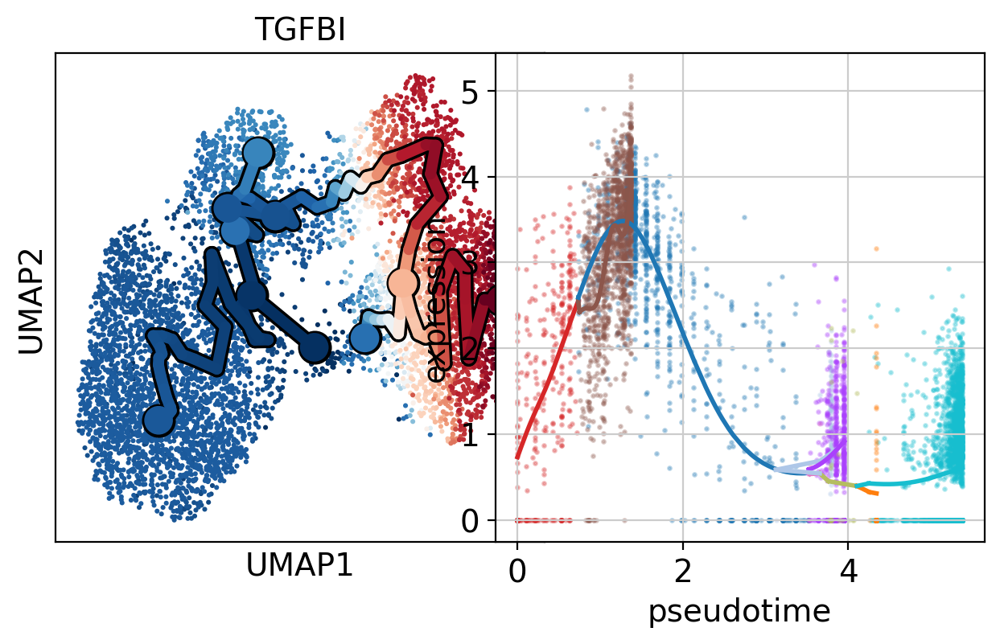

In [157]:

scf.pl.single_trend(bdata,"TGFBI",basis="umap",wspace=-.25,save="_E1.pdf")

#### Store data

In [158]:
adata.write('/storage/users/data/PANC/H5AD_file/IV_time_adata_no_2D_lindev_sign_fit_filt_clust.h5ad')

In [159]:
adata

AnnData object with n_obs × n_vars = 6235 × 491
    obs: 'condition', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'pct_cmo', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'outlier', 'leiden', 't', 'seg', 'edge', 't_sd', 'milestones', '12->64_lindev_sel'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'CMO', 'gene_symbol', 'mito', 'ribo', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', '12->64_rss', 'p_val', 'A', 'fdr', 'st', 'signi', 'clusters'
    uns: '12->64_lindev_sel_colors', 'condition_colors', 'dendro_segments', 'draw_graph', 'graph', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'mileston

In [162]:
ls /storage/users/data/PANC/H5AD_file/


adata_filtered.h5ad
adata_filtered_hvg.h5ad
adata_filtered_hvg_IV_test.h5ad
adata_filtered_no2D.h5ad
adata_filtered_no2D_hvg_clust.h5ad
adata_filtered_no2D_hvg_clust_palantir.h5ad
adata_filtered_no2D_hvg_clust_pub.h5ad
adata_filtered_no2D_hvg_clust_time2.h5ad
adata_filtered_no2D_hvg_clust_time3.h5ad
adata_filtered_no2D_hvg_clust_time4_clust.h5ad
adata_filtered_no2D_hvg_clust_time4.h5ad
adata_filtered_no2D_hvg_clust_time.h5ad
adata_filtered_no2D_hvg_clust_time_pub.h5ad
adata_filtered_no2D_hvg.h5ad
adata_filtered_no2D_hvg_pub.h5ad*
adata_filtered_no2D_hvg_time.h5ad
combined_adata.h5ad*
filtered_norma_2D3D_adata.h5ad
filtered_norma_2D3D_adata_IVN.h5ad
filtered_norma_2D3D_adata_with_IVN.h5ad
filtered_norma_2D3D__with_IVN.h5ad
IV_adata_filtered.h5ad
IV_adata_filtered_hvg_clust.h5ad
IV_adata_filtered_hvg.h5ad
IV_adata_filtered_no2D_clust.h5ad
IV_adata_filtered_no2D.h5ad
IV_adata_filtered_no2D_hvg_clust.h5ad
IV_adata_filtered_no2D_hvg_clust_time2.h5ad
IV_adata_filtered_no2D_hvg_clust_time3.h5

In [161]:
#adata = sc.read("/storage/users/sac43cg/res_Samantha_1/outs/per_sample_outs/time_adata.h5ad")
bdata = sc.read("/storage/users/data/PANC/H5AD_file/IV_time_adata_filt_clust_sign.h5ad")

FileNotFoundError: [Errno 2] Unable to synchronously open file (unable to open file: name = '/storage/users/data/PANC/H5AD_file/IV_time_adata_filt_clust_sign.h5ad', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)